# Example: A household portfolio problem

In this example, let's solve a 3-dimensional household portfolio prolem.


$$
\begin{align}
& v(a,b,z) = \max_{c,\ell,a',b'} \frac{c^{1-\gamma}}{1-\gamma} - \frac{\ell^{1+\nu}}{1+\nu} + \beta \mathbb{E}\{ v(a',b',z') | z \}  \\
& c + q \cdot a' + Q \cdot b' = a + z b + \ell \\
& c>0,\ell > 0, a' > 0, b' > 0 \\
& z \sim \text{MarkovChain}
\end{align}
$$


**Parameterization**

- $\gamma = 2$
- $\nu = 2$
- $\beta = 0.9$
- $q = \beta$
- $Q = 0.8 \cdot \beta$

$$
z \in \{ 0.5, 1.0, 2.0 \}; P_z = \begin{bmatrix}
    0.8 & 0.2 & 0.0 \\
    0.15 & 0.7 & 0.15 \\
    0.0 & 0.2 & 0.8
\end{bmatrix}
$$

In [10]:
# Setup environment

import AdaptiveSG as asg
import Collocations as cloc

import Roots

import Plots as plt
import ProgressBars: ProgressBar

In [11]:
# Initialize a sparse multi-linear interpolant & materialize its grid nodes
vitp, nzer, pars = let accuracy = 6

    # define: economic parameters
    local pars = (
        γ = 2.0,
        ν = 2.0,
        β = 0.9,
        q = 0.9,
        Q = 0.8 * 0.9,
        zstates = [0.5, 1.0, 2.0],
        Pz = [
            0.8 0.2 0.0;
            0.15 0.7 0.15;
            0.0 0.2 0.8;
        ]
    )

    # define: computation box space for (a,b) endo states
    local nzer = asg.Normalizer{2}(
        (0.01, 0.01),
        (20.0, 20.0),
    )

    # define: sparse grid interpolant of v(x|z)
    local vitp = asg.RegularSparseGrid{2}(
        accuracy,
        ntuple(_ -> accuracy, 2),
    )

    # init: train a guess, applies to all z states for simplicity
    asg.train!(
        vitp,
        X01 -> begin
            a, b = asg.denormalize(X01, nzer)
            # assume: z = 1.0, l = 1.0
            wealth = a + 1.0 * b + 1.0
            c = (1 - pars.β) * wealth
            u = c^(1 - pars.γ) / (1 - pars.γ) - 1.0^(1 + pars.ν) / (1 + pars.ν)
            return u / (1 - pars.β)
        end,
        printlevel = "final",
        validate_io = false,
    )

    vitp, nzer, pars
end # let

The RSG is trained.


(RegularSparseGrid{2}(depth = 6, #nodes = 145, max_levels = (6, 6)), Normalizer{2}
	x[1] in [0.01, 20.0]
	x[2] in [0.01, 20.0]
, (γ = 2.0, ν = 2.0, β = 0.9, q = 0.9, Q = 0.7200000000000001, zstates = [0.5, 1.0, 2.0], Pz = [0.8 0.2 0.0; 0.15 0.7 0.15; 0.0 0.2 0.8]))

In [12]:
# Define a collocation problem
mcu = cloc.MarkovCollocationUniform(
    asg.basis_matrix(vitp),
    pars.Pz,
    D        = 2, # (a,b)
    J        = 1, # (z,)
    dimnames = (:a, :b),
    β        = pars.β,
)

# Init: the guess of θs and θEs
mcu.θs  = repeat(vitp |> asg.interpcoef, outer = (1, pars.zstates |> length) )
mcu.θEs = repeat(vitp |> asg.interpcoef, outer = (1, pars.zstates |> length) )

# Pre-condition: the collocation problem
cloc.precond!(mcu)
cloc.validate!(mcu)

display(mcu)

UniformMarkovCollocation{D=2,N=145,K=3,J=1}
- dimnames of x states        : [:a, :b]
- dimension of endog states   : D = 2
- dimension of exog shocks    : J = 1
- discount factor             : β = 0.9
- # of grid nodes             : N = 145
- # of states in Markov chain : K = 3
- # of v(x,z)       interp coefficients N*K = 435
- # of E{v(x,z')|z} interp coefficients N*K = 435
- size of Jacobian matrix : (870, 870)


In [13]:
# Prepare the iteration

# specify: the iteration parameters
maxiter   = 100
showevery = maxiter ÷ 20
atol      = 1E-3

# pre-cond: shape parameters
N = size(mcu.ΦX, 1)
K = size(mcu.Pz, 2)
D = 2 # (a,b)
J = 1 # (z,)

# pre-cond: the materialized (a,b) grid nodes
Xnodes = [
    asg.denormalize(xi, nzer)
    for xi in vitp |> asg.vectorize_x |> eachrow
] |> stack |> permutedims

# pre-cond: the candidate (a',b') grid nodes for grid-search optimization
abCands = Iterators.product(
    LinRange(nzer, 1, 20),
    LinRange(nzer, 2, 20),
) |> collect |> vec |> stack |> permutedims

# malloc: the old guess of (θs, θEs); for convergence check
θs_old = copy(mcu.θs)
θEs_old = copy(mcu.θEs)

# malloc: the optimal U(x,c) and Xnext(x,c) for all `z` states, and Φ(Xnext)
Us  = similar(mcu.Us)
Xp  = [zeros(N,D) for _ in 1:K]
ΦXp = [cloc.spzeros(mcu.ΦX |> size) for _ in 1:K]

# malloc: error trace for convergence check
errTrace = Float64[]

# malloc: optimal policy functions
Cs  = similar(mcu.Us) # c(x,z)
Ls  = similar(mcu.Us) # l(x,z)
Aps = similar(mcu.Us) # a'(x,z)
Bps = similar(mcu.Us) # b'(x,z)

println(names(Main))

[:Aps, :Base, :Bps, :Core, :Cs, :D, :J, :K, :Ls, :Main, :N, :Us, :Xnodes, :Xp, :abCands, :atol, :errTrace, :maxiter, :mcu, :nzer, :pars, :showevery, :vitp, :ΦXp, :θEs_old, :θs_old]


**Hints**

Define the wealth change: $\Delta n := (a + z b) - (q \cdot a' + Q \cdot b')$,
then the budget constraint:

$$
c - \ell = \Delta n
$$

The FOC tells:

$$
c^{-\gamma} = \ell^\nu
$$

Thus, when fixing a $\Delta n$, the optimal consumption and labor supply is:

$$
c - c^{-\gamma/\nu} = \Delta n
$$

Notice that:

$$
\lim_{c\to 0} c - c^{-\gamma/\nu} = -\infty \\
\lim_{c \to\infty} c - c^{-\gamma/\nu} = \infty
$$

Thus, there always exists a unqiue positive $c$ that satisfies the budget constraint.

In [14]:
# Fixed point iteration
@time for t in 1:maxiter

    # optimize: search the optimal policy functions for each state
    # for simplicity, use grid search
    # for (k,i) in ProgressBar(Iterators.product(1:K, 1:N), width = UInt64(80))
    for k in 1:K
        # update 𝔼{v(x',z')|z} interpolants using the current guess
        asg.update_all!(
            vitp,
            asg.Dictionary{asg.Node{2},Float64}(
                vitp.nv |> keys,
                mcu.ΦX * mcu.θEs[:,k]
            ),
            printlevel = "none",
        )

        for i in 1:N
        
            aNow = Xnodes[i,1]
            bNow = Xnodes[i,2]
            zNow = pars.zstates[k]

            Δn = (aNow + zNow * bNow) .- (pars.q .* abCands[:,1] .+ pars.Q .* abCands[:,2])

            cCands = [
                Roots.fzero(logc -> exp(logc) - exp(logc)^(-pars.γ / pars.ν) - Δn[j], 10.0)
                for j in 1:length(Δn)
            ] .|> exp
            lCands = cCands .^ (-pars.γ / pars.ν)
            uCands = cCands .^ (1 .- pars.γ) ./ (1 .- pars.γ) .- lCands .^ (1 .+ pars.ν) ./ (1 .+ pars.ν)
            evCands = pars.β * [
                asg.evaluate(vitp, ab, nzer)
                for ab in abCands |> eachrow
            ]

            uOpt, idx = findmax(uCands .+ evCands)

            # store results, including policies, U(X) stackings, and Xnext(X)
            Cs[i,k]  = cCands[idx]
            Ls[i,k]  = lCands[idx]
            Aps[i,k] = abCands[idx,1]
            Bps[i,k] = abCands[idx,2]
            Us[i,k]  = uCands[idx]

            Xp[k][i,:] = [Aps[i,k], Bps[i,k]]

            # eval: Φ(Xnext|z) for each z state
            ΦXp[k][i,:] = asg.basis_matrix(
                asg.normalize(
                    Xp[k][i,:],
                    nzer
                ),
                vitp
            )
            
        end # i
    end # k

    # load: the stacking U(X) and ΦXnext to the collocation problem
    mcu.Us = Us
    mcu.ΦXnext = ΦXp
    
    # solve: the pseudo-linear system for θs and θEs
    cloc.update_θ!(mcu, solver = :fvi)

    # compute: the error statistics
    errAgg = let 
        
        err4z_θs = maximum(
            abs,
            mcu.θs .- θs_old, 
            dims = 1
        ) |> vec
        err4z_θEs = maximum(
            abs,
            mcu.θEs .- θEs_old, 
            dims = 1
        ) |> vec

        errAgg = max(
            maximum(err4z_θs),
            maximum(err4z_θEs)
        )
        push!(errTrace, errAgg)

        # report
        if t % showevery == 0
            println("t = $t")
            println("\t- errAgg = $errAgg")
            println("\t- err4z_θs = $err4z_θs")
            println("\t- err4z_θEs = $err4z_θEs")
        end

        errAgg
    end # let


    # check: convergence
    if errAgg < atol
        println("Converged in iteration $t !")
        break
    end


    # update the old guess
    copyto!(θs_old, mcu.θs)
    copyto!(θEs_old, mcu.θEs)

end # t

t = 5
	- errAgg = 0.6223636968232276
	- err4z_θs = [7.105427357601002e-15, 1.4210854715202004e-14, 1.4210854715202004e-14]
	- err4z_θEs = [0.6223636968232276, 0.4273866530727686, 0.48983044568837686]
t = 10
	- errAgg = 0.1987290144021222
	- err4z_θs = [1.4210854715202004e-14, 3.552713678800501e-15, 7.105427357601002e-15]
	- err4z_θEs = [0.1647639471782636, 0.16421975602381167, 0.1987290144021222]
t = 15
	- errAgg = 0.11797625026965991
	- err4z_θs = [2.6645352591003757e-15, 3.552713678800501e-15, 1.4210854715202004e-14]
	- err4z_θEs = [0.10796896647164012, 0.09697012373450065, 0.11797625026965991]
t = 20
	- errAgg = 0.06966157819339294
	- err4z_θs = [2.6645352591003757e-15, 3.552713678800501e-15, 3.552713678800501e-15]
	- err4z_θEs = [0.0589453909575548, 0.05803202105029159, 0.06966157819339294]
t = 25
	- errAgg = 0.04113448013841914
	- err4z_θs = [3.552713678800501e-15, 2.6645352591003757e-15, 1.7763568394002505e-15]
	- err4z_θEs = [0.036001644676778355, 0.03485203335203657, 0.04113448

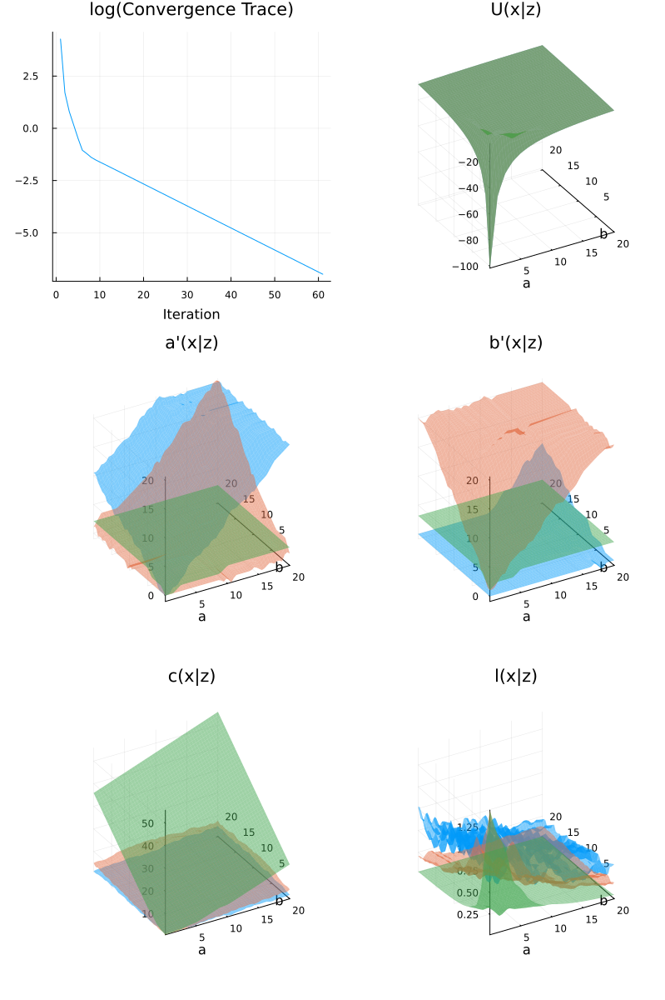

In [15]:
# Visualize the results
let 

    figs = plt.Plot[]

    # fig: convergence trace
    push!(figs, plt.plot(
        errTrace .|> log,
        title = "log(Convergence Trace)",
        xlabel = "Iteration",
        ylabel = "Error",
        legend = false,
    ))

    # fig: value function by `z` states
    fig = plt.surface(camera = (-30,30), colorbar = false, xlabel = "a", ylabel = "b", title = "U(x|z)")
    for k in 1:K
        asg.update_all!(
            vitp,
            asg.Dictionary{asg.Node{2},Float64}(
                vitp.nv |> keys,
                mcu.ΦX * mcu.θs[:,k]
            ),
            printlevel = "none",
        )
        plt.surface!(
            fig,
            LinRange(nzer, 1, 50),
            LinRange(nzer, 1, 50),
            (a,b) -> asg.evaluate(vitp, [a,b], nzer),
            color = k,
            alpha = 0.5,
        )
    end
    push!(figs, fig)

    # fig: a' policy function by `z` states
    fig = plt.surface(camera = (-30,30), colorbar = false, xlabel = "a", ylabel = "b", title = "a'(x|z)")
    for k in 1:K
        asg.update_all!(
            vitp,
            asg.Dictionary{asg.Node{2},Float64}(
                vitp.nv |> keys,
                Aps[:,k]
            ),
            printlevel = "none",
        )
        plt.surface!(
            fig,
            LinRange(nzer, 1, 50),
            LinRange(nzer, 1, 50),
            (a,b) -> asg.evaluate(vitp, [a,b], nzer),
            color = k,
            alpha = 0.5,
        )
    end
    push!(figs, fig)

    # fig: b' policy function by `z` states
    fig = plt.surface(camera = (-30,30), colorbar = false, xlabel = "a", ylabel = "b", title = "b'(x|z)")
    for k in 1:K
        asg.update_all!(
            vitp,
            asg.Dictionary{asg.Node{2},Float64}(
                vitp.nv |> keys,
                Bps[:,k]
            ),
            printlevel = "none",
        )
        plt.surface!(
            fig,
            LinRange(nzer, 1, 50),
            LinRange(nzer, 1, 50),
            (a,b) -> asg.evaluate(vitp, [a,b], nzer),
            color = k,
            alpha = 0.5,
        )
    end
    push!(figs, fig)

    # fig: c policy function by `z` states
    fig = plt.surface(camera = (-30,30), colorbar = false, xlabel = "a", ylabel = "b", title = "c(x|z)")
    for k in 1:K
        asg.update_all!(
            vitp,
            asg.Dictionary{asg.Node{2},Float64}(
                vitp.nv |> keys,
                Cs[:,k]
            ),
            printlevel = "none",
        )
        plt.surface!(
            fig,
            LinRange(nzer, 1, 50),
            LinRange(nzer, 1, 50),
            (a,b) -> asg.evaluate(vitp, [a,b], nzer),
            color = k,
            alpha = 0.5,
        )
    end
    push!(figs, fig)

    # fig: l policy function by `z` states
    fig = plt.surface(camera = (-30,30), colorbar = false, xlabel = "a", ylabel = "b", title = "l(x|z)")
    for k in 1:K
        asg.update_all!(
            vitp,
            asg.Dictionary{asg.Node{2},Float64}(
                vitp.nv |> keys,
                Ls[:,k]
            ),
            printlevel = "none",
        )
        plt.surface!(
            fig,
            LinRange(nzer, 1, 50),
            LinRange(nzer, 1, 50),
            (a,b) -> asg.evaluate(vitp, [a,b], nzer),
            color = k,
            alpha = 0.5,
        )
    end
    push!(figs, fig)


    layout = (3,2)
    plt.plot(
        figs...,
        layout = layout,
        size   = reverse(layout) .* 400
    )
end # let